In [1]:
from dotenv import load_dotenv
import os

load_dotenv()

True

In [2]:
from entsoe import EntsoePandasClient
import pandas as pd

entsoe_client = EntsoePandasClient(api_key=os.getenv('ENTSOE_API_KEY'))

df = entsoe_client.query_load_and_forecast(
    country_code="CH", 
    start=pd.Timestamp('2013-01-01 00:00', tz="Europe/Zurich"), 
    end=pd.Timestamp('2025-01-01 00:00', tz="Europe/Zurich"),
)
df.head(5)

,Forecasted Load,Actual Load
2014-10-24 00:00:00+02:00,NaN,6522.0
2014-10-24 01:00:00+02:00,NaN,6342.0
2014-10-24 02:00:00+02:00,NaN,6269.0
2014-10-24 03:00:00+02:00,NaN,6230.0
2014-10-24 04:00:00+02:00,NaN,6257.0


In [3]:
df_ = df.copy()

In [4]:
df = df_.copy()

# Basic infos

In [21]:
print("Shape: \t\t", df.shape)
print(f"Timestamps ranging {df.index.min()} => {df.index.max()}")
print('dtypes: \t', df.dtypes.to_dict())
print('index dtype: \t', df.index.dtype)

Shape: 		 (85813, 2)
Timestamps ranging 2014-10-24 00:00:00+02:00 => 2024-10-14 23:00:00+02:00
dtypes: 	 {'Forecasted Load': dtype('float64'), 'Actual Load': dtype('float64')}
index dtype: 	 datetime64[ns, Europe/Zurich]


{'Forecasted Load': dtype('float64'), 'Actual Load': dtype('float64')}

# Actual load lineplot

In [199]:
import plotly.express as px

fig = px.line(
    df, x=df.index, y='Actual Load', 
    markers=True, 
    title='Lineplot of all the available Actual Load',
    labels={'index': 'Date', 'Actual Load': 'Actual Load [MW]'}
)

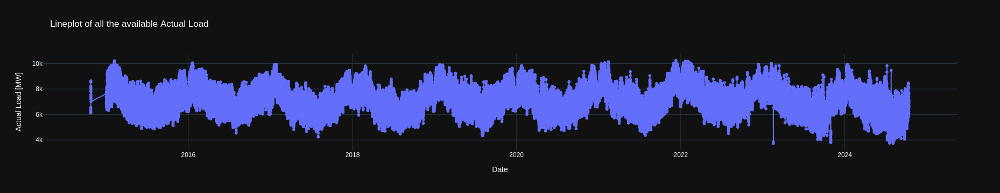

In [200]:
fig.layout.template = "plotly_dark"
fig.show()

In [201]:
fig.write_html("actual_load_lineplot.html", include_plotlyjs='cdn')

# Empty data

In [202]:
df = df_.copy()
df.head(3)

,Forecasted Load,Actual Load
2014-10-24 00:00:00+02:00,NaN,6522.0
2014-10-24 01:00:00+02:00,NaN,6342.0
2014-10-24 02:00:00+02:00,NaN,6269.0


In [203]:
import plotly.express as px

df.loc[df['Actual Load'].isna(), 'color'] = 'Empty Actual Load'
df.loc[df['Forecasted Load'].isna(), 'color'] = 'Empty Forecasted Load'

mask = df.isna().any(axis=1)
fig = px.scatter(
    x=df[mask].index, y=mask[mask], color=df[mask].color,
    title='Scatterplot of the empty loads (Actual & Forecasted)',
    labels={'x': 'Date', 'y': 'Whether the data is empty', 'color': ''}
)

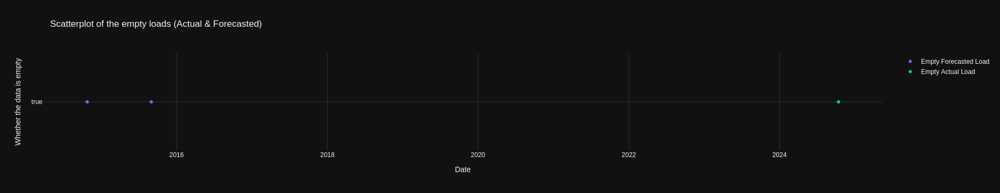

In [204]:
fig.layout.template = "plotly_dark"
fig.show()

In [205]:
fig.write_html("empty_load_lineplot.html", include_plotlyjs='cdn')

# Missing data

In [206]:
df = df_.copy()
df.head(3)

,Forecasted Load,Actual Load
2014-10-24 00:00:00+02:00,NaN,6522.0
2014-10-24 01:00:00+02:00,NaN,6342.0
2014-10-24 02:00:00+02:00,NaN,6269.0


In [207]:
import plotly.express as px

df = df.asfreq('h', fill_value='FILLED')

df.loc[(df == 'FILLED').any(axis=1), 'color'] = 'Missing Load'
mask = (df == 'FILLED').any(axis=1)

fig = px.scatter(
    x=df[mask].index, y=mask[mask], color=df[mask].color,
    title='Scatterplot of the missing loads (Actual & Forecasted)',
    labels={'x': 'Date', 'y': 'Whether the data is missing', 'color': ''}
)

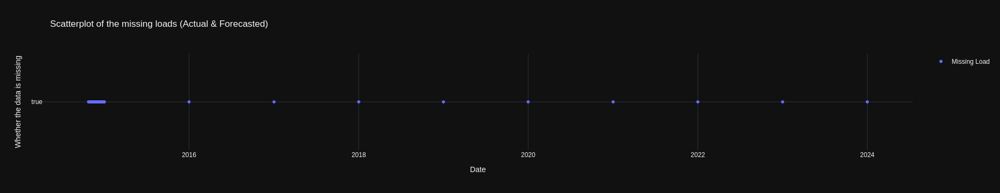

In [208]:
fig.layout.template = "plotly_dark"
fig.show()

In [209]:
fig.write_html("missing_load_lineplot.html", include_plotlyjs='cdn')

# Duplicated data

In [210]:
df = df_.copy()
df.head(3)

,Forecasted Load,Actual Load
2014-10-24 00:00:00+02:00,NaN,6522.0
2014-10-24 01:00:00+02:00,NaN,6342.0
2014-10-24 02:00:00+02:00,NaN,6269.0


In [219]:
import plotly.express as px

df.index.duplicated().any()

False

# ENTSO-E official prediction

In [312]:
df = df_.copy()
df.head(3)

,Forecasted Load,Actual Load
2014-10-24 00:00:00+02:00,NaN,6522.0
2014-10-24 01:00:00+02:00,NaN,6342.0
2014-10-24 02:00:00+02:00,NaN,6269.0


In [313]:
import plotly.express as px

df = df.dropna()
df['APE'] = df.apply(lambda row: 100 * abs(row['Actual Load'] - row['Forecasted Load']) / row['Actual Load'], axis=1)
fig = px.scatter(
    df, x=df.index, y='APE', 
    title='Scatterplot of the ENTSO-E forecast\'s Absolute Percentage Error (APE)',
    labels={'index': 'Date', 'APE': 'APE [%]'}
)
fig.add_hline(y=df.APE.mean(), line_dash="dot",
              annotation_text="MAPE", 
              annotation_position="top right");
#fig.update_traces(marker={'symbol': 'x', 'opacity': 0.5});

In [314]:
df.APE.mean()

5.8169099473089965

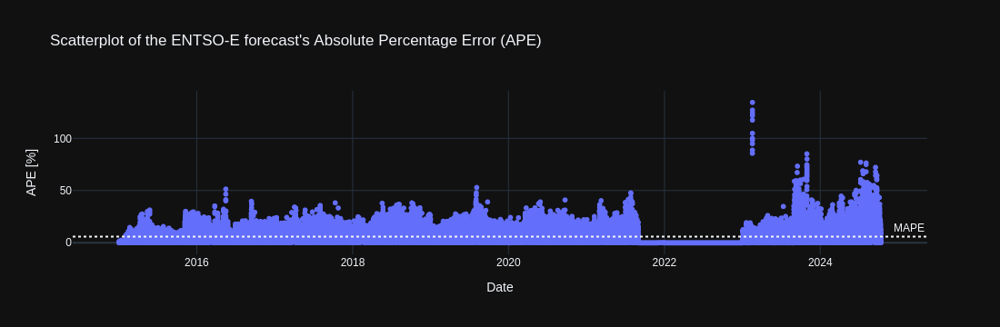

In [315]:
fig.layout.template = "plotly_dark"
fig.show()

In [316]:
fig.write_html("ape_scatterplot.html", include_plotlyjs='cdn')

# MAPE timeframes

In [317]:
from datetime import timedelta
import plotly.express as px

# Figure out the latest timestamp with a load
with_load_latest_ts = df[~df['Actual Load'].isna()].index.max() 

# Compute the MAPE over different timespans
delta_h_to_mape = {}
for delta_h in [1, 24, 48, 24*7, 24*30, 24*365]:
    delta_h_to_mape[delta_h] = df.APE[df.index > with_load_latest_ts - timedelta(hours=delta_h)].mean()

# Combine the MAPE values into a dataframe for easier plotting
mape_df = pd.DataFrame({
    'delta_time': ['Last hour', 'Last 24h', 'Last 2 days', 'Last week', 'Last month', 'Last year'],
    'MAPE': delta_h_to_mape.values()
})

fig = px.scatter(
    mape_df, x='delta_time', y='MAPE', 
    title='Scatterplot of the ENTSO-E forecast\'s Mean Absolute Percentage Error (MAPE), <br>over different timespans',
    labels={'delta_time': 'Timespan', 'MAPE': 'MAPE [%]'}
)

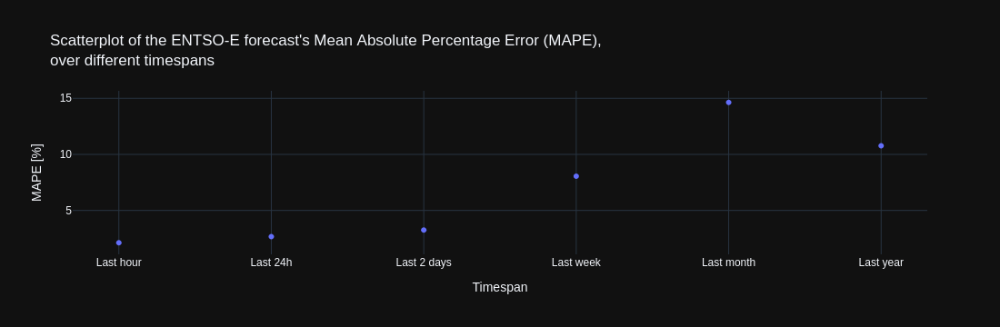

In [318]:
fig.layout.template = "plotly_dark"
fig.show()

In [319]:
fig.write_html("mape_scatterplot.html", include_plotlyjs='cdn')